In [103]:
# installing the Kaggle library
!pip install kaggle

In [104]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Importing the Dog vs Cat Dataset from Kaggle

In [105]:
# Kaggle API
!kaggle competitions download -c dogs-vs-cats

dogs-vs-cats.zip: Skipping, found more recently modified local copy (use --force to force download)


In [106]:
!ls

 dogs-vs-cats.zip   image.jpg	     kaggle.json   sampleSubmission.csv   train
'image 2.jpg'	   'image resized'   sample_data   test1.zip		  train.zip


In [107]:
# extracting the compressed dataset
from zipfile import ZipFile
dataset = '/content/dogs-vs-cats.zip'
with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [108]:
# extracting the compressed dataset
from zipfile import ZipFile
dataset = '/content/train.zip'
with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [109]:
import os
#counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
file_count = len(files)
print('Number of images:', file_count)

Number of images: 25000


Printing the name of images

In [110]:
file_names = os.listdir('/content/train')
print(file_names)

['dog.2181.jpg', 'cat.11936.jpg', 'dog.3605.jpg', 'cat.5154.jpg', 'dog.5923.jpg', 'dog.7159.jpg', 'cat.6320.jpg', 'cat.7128.jpg', 'cat.8677.jpg', 'dog.12322.jpg', 'cat.1362.jpg', 'cat.4658.jpg', 'dog.11182.jpg', 'cat.11473.jpg', 'cat.4900.jpg', 'dog.3135.jpg', 'dog.11434.jpg', 'cat.11998.jpg', 'cat.4153.jpg', 'cat.6794.jpg', 'cat.1032.jpg', 'dog.5491.jpg', 'cat.1808.jpg', 'cat.4907.jpg', 'dog.6242.jpg', 'cat.11604.jpg', 'cat.4512.jpg', 'cat.9455.jpg', 'dog.1018.jpg', 'dog.11753.jpg', 'cat.1022.jpg', 'cat.8311.jpg', 'cat.2453.jpg', 'cat.8770.jpg', 'dog.1156.jpg', 'cat.8395.jpg', 'cat.8949.jpg', 'dog.1323.jpg', 'cat.3695.jpg', 'dog.9667.jpg', 'dog.8768.jpg', 'dog.6894.jpg', 'cat.3823.jpg', 'cat.8117.jpg', 'cat.470.jpg', 'cat.240.jpg', 'cat.4796.jpg', 'dog.7815.jpg', 'dog.7000.jpg', 'dog.1263.jpg', 'cat.2067.jpg', 'dog.1992.jpg', 'cat.7894.jpg', 'cat.10617.jpg', 'dog.8200.jpg', 'cat.10164.jpg', 'dog.4965.jpg', 'cat.5305.jpg', 'cat.5243.jpg', 'dog.1076.jpg', 'cat.4426.jpg', 'cat.11881.jpg'

Importing the Dependencies

In [111]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

Displaying the images of dogs and cats

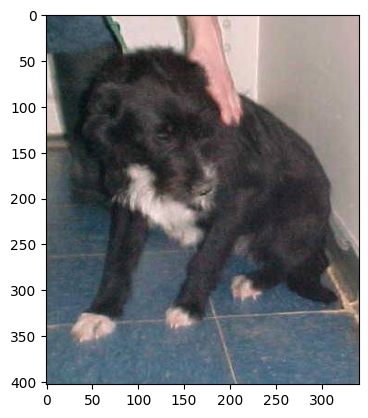

In [112]:
# display cat image
img = mpimg.imread('/content/train/dog.5270.jpg')
imgplt = plt.imshow(img)


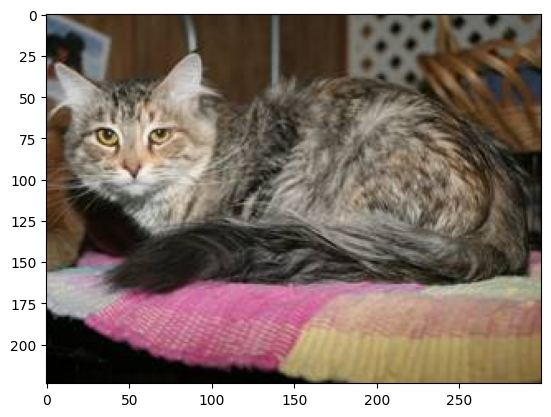

In [113]:
# display cat image
img = mpimg.imread('/content/train/cat.7927.jpg')
imgplt = plt.imshow(img)


In [114]:
file_names = os.listdir('/content/train')

for i in range(5) :

  name=file_names[i]
  print(name[0:3])


dog
cat
dog
cat
dog


In [115]:
file_names = os.listdir('/content/train')

dog_count = 0
cat_count = 0

for img_file in file_names:

  name = img_file[0:3]

  if name == 'dog':
    dog_count += 1
  else:
    cat_count += 1
print( 'Number of dog images', dog_count)
print( 'Number of cat images', cat_count)



Number of dog images 12500
Number of cat images 12500


Resizing all the images

In [116]:
# Creating a directory for resized images

 os.mkdir('/content/image resized')

In [117]:
original_folder = '/content/train/'
resized_folder = '/content/image resized/'

for i in range(2000) :

 filename = os.listdir(original_folder)[i]
 img_path = original_folder + filename

 img = Image.open(img_path)
 img = img.resize((224,224))
 img = img.convert('RGB')

 newImgPath = resized_folder+filename
 img.save(newImgPath)

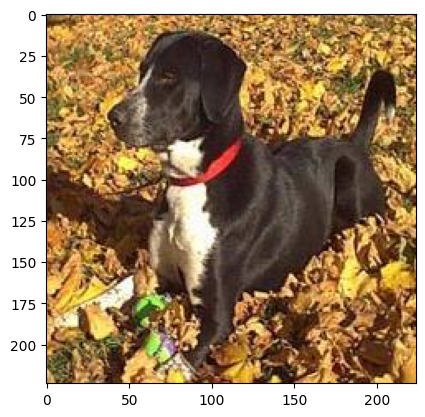

In [118]:
# display resized dog image
img = mpimg.imread('/content/image resized/dog.10071.jpg')
imgplt = plt.imshow(img)



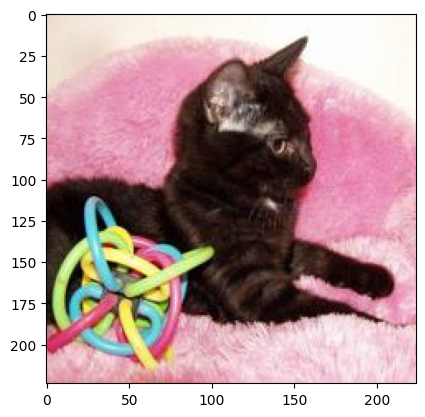

In [119]:
# display resized cat image
img = mpimg.imread('/content/image resized/cat.9229.jpg')
imgplt = plt.imshow(img)


Creating Labels for resized images of dogs and cats


cat --> 0
Dog --> 1



In [120]:
# Creating a for loop to assign labels

filenames = os.listdir('/content/image resized/')

labels = []

for i in range(2000):

   filename = file_names[i]
   label = filename[0:3]

   if label == "dog":
    labels.append(1)
   else:
    labels.append(0)


In [121]:
print(filenames[0:5])
print(len(filenames))

['dog.2181.jpg', 'cat.11936.jpg', 'dog.3605.jpg', 'cat.5154.jpg', 'dog.5923.jpg']
2000


In [122]:
print(labels[0:5])
print(len(labels))

[1, 0, 1, 0, 1]
2000


In [123]:
# counting the images of dogs and cats out of 2000 images
values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)


[0 1]
[ 994 1006]


Converting all the resized images to numpy arrays

In [124]:
import cv2
import glob


In [125]:
image_directory = '/content/image resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [126]:
print(dog_cat_images)

[[[[  6   4   4]
   [  5   3   3]
   [  5   3   3]
   ...
   [  7   5   5]
   [  7   5   5]
   [  7   5   5]]

  [[  7   5   5]
   [  5   3   3]
   [  5   3   3]
   ...
   [  7   5   5]
   [  7   5   5]
   [  7   5   5]]

  [[  8   6   6]
   [  6   4   4]
   [  5   3   3]
   ...
   [  8   6   6]
   [  8   6   6]
   [  8   6   6]]

  ...

  [[ 47  91  98]
   [ 92 131 139]
   [ 68  98 109]
   ...
   [ 42  64  75]
   [ 39  64  74]
   [ 22  47  57]]

  [[ 53  97 104]
   [ 91 130 138]
   [ 39  67  78]
   ...
   [ 32  57  67]
   [ 31  56  66]
   [ 16  41  51]]

  [[ 63 107 114]
   [ 77 116 124]
   [ 31  57  71]
   ...
   [ 25  50  60]
   [ 25  50  60]
   [ 12  37  47]]]


 [[[ 24  30  25]
   [ 24  30  25]
   [ 24  30  25]
   ...
   [147 142  97]
   [152 148 100]
   [156 152 104]]

  [[ 24  30  25]
   [ 24  30  25]
   [ 24  30  25]
   ...
   [147 142  97]
   [153 149 101]
   [156 152 104]]

  [[ 25  31  26]
   [ 25  31  26]
   [ 25  31  26]
   ...
   [148 144  96]
   [153 149 101]
   [158 154

In [127]:
type(dog_cat_images)

numpy.ndarray

In [128]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


In [129]:
  X = dog_cat_images
  Y = np.array(labels)

**Train Test Split**

In [130]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y , test_size=0.2, random_state=2)

In [131]:
print(X.shape, X_train.shape, X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


1600 --> training images
400 --> Test Images


In [132]:
# scaling the data
X_train_scaled = X_train/255
X_test_scaled = X_test/255

In [133]:
print(X_train_scaled)

[[[[0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   ...
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]]

  [[0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   ...
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]]

  [[0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   ...
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]]

  ...

  [[0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   ...
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]
   [0.00392157 0.00392157 0.00392157]]

  [[0.00392157 0.00392157 0.00392157]
   [0.0

Building the Neural Network

In [134]:
import tensorflow as tf
import tensorflow_hub as hub

In [135]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)


In [136]:
num_of_classes = 2

model = tf.keras.Sequential([

    pretrained_model,
    tf.keras.layers.Dense(num_of_classes)

])

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_6 (Dense)             (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [137]:
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ['acc']
)

In [138]:
model.fit(X_train_scaled, Y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 76s 1s/step - loss: 0.2139 - acc: 0.9112
Epoch 2/5
50/50 [==============================] - 61s 1s/step - loss: 0.0677 - acc: 0.9794
Epoch 3/5
50/50 [==============================] - 65s 1s/step - loss: 0.0513 - acc: 0.9850
Epoch 4/5
50/50 [==============================] - 66s 1s/step - loss: 0.0391 - acc: 0.9887
Epoch 5/5
50/50 [==============================] - 61s 1s/step - loss: 0.0318 - acc: 0.9937


In [139]:
score, acc = model.evaluate(X_test_scaled, Y_test)
print('Test Loss =', score)
print('Test Accuracy = ', acc)

13/13 [==============================] - 17s 1s/step - loss: 0.0645 - acc: 0.9775
Test Loss = 0.06446342170238495
Test Accuracy =  0.9775000214576721


**Predictive System**

path ofthe image to be predicted :/content/image.jpg


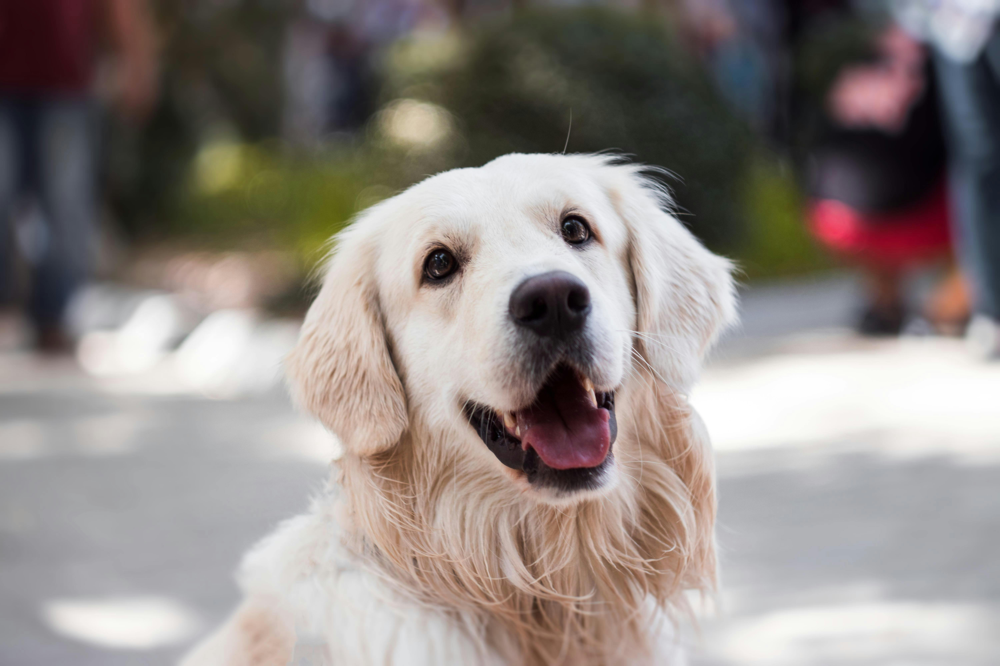

1/1 [==============================] - 1s 1s/step
[[-4.0961328  3.3951652]]
1
The image represents a dog


In [140]:
input_image_path = input('path ofthe image to be predicted :')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 0:
  print('The image represents a cat')
else:
  print('The image represents a dog')

path ofthe image to be predicted :/content/image 2.jpg


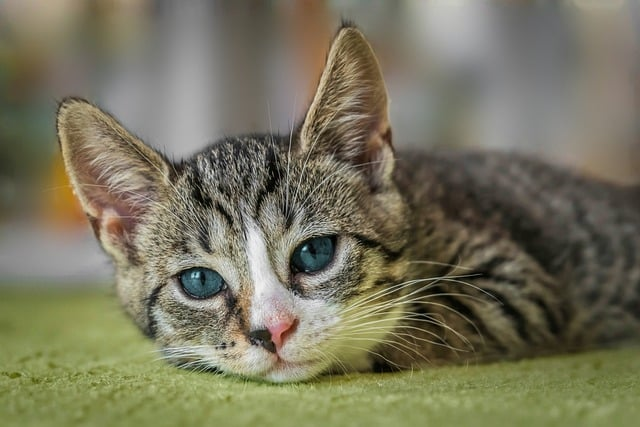

1/1 [==============================] - 0s 160ms/step
[[ 3.2372503 -4.4559   ]]
0
The image represents a cat


In [141]:
input_image_path = input('path ofthe image to be predicted :')

input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)


if input_pred_label == 0:
  print('The image represents a cat')
else:
  print('The image represents a dog')